## Assignment for Week 7 - Performance Evaluations

#### Performance Evaluations: ROC Curves

Bank Marketing data:  https://archive.ics.uci.edu/ml/datasets/bank+marketing. Use the bank-additional-full.csv.

The data is related with direct marketing campaigns of a Portuguese banking institution. The marketing campaigns were based on phone calls. Often, more than one contact to the same client was required, in order to access if the product (bank term deposit) would be ('yes') or not ('no') subscribed. 

I used KNeighborsClassifier, DecisionTreeClassifier, and RandomForestClassifier and plotted the ROC curves for all three models. Of these, RandomForestClassifier performed best. Although these three methods have been demonstrated in this class, they did appear to be pretty good choices. I compare these three with LinearRegression. I also discovered LazyPredict and applied the LazyClassifier to the same train/test splits which gave these three methods good scores. LazyRegressor; however, broke my machine - even with the data pared down and standardized. (I let it run overnight and the progress bar never exceeded 71%.) LazyClassifier provided metrics: Accuracy, Balanced Accuracy, ROC AUC, F1 Score, and Time Taken. 

In [1]:
# Imports

import pandas as pd

In [2]:
# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier

#LGBM Classifier Code:

from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

import lazypredict
from lazypredict.Supervised import LazyClassifier

# plotting
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
sns.set() 

import numpy as np
import random as rnd

import warnings
warnings.filterwarnings("ignore")

#set scientific notation
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [3]:
#load data set and preliminary examination
df = pd.read_csv('bank-additional-full.csv', sep=";")

type(df)
df.shape
df.info()
df.head(10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.100,93.994,-36.400,4.857,5191.000,no


Visualization 1
Bar plot of job distribution



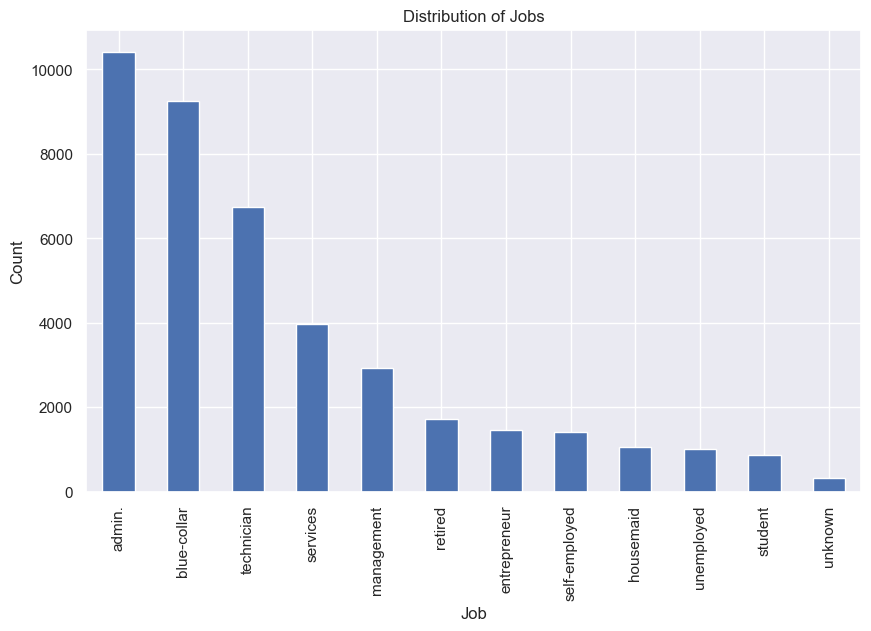

In [4]:
# Bar plot of job distribution
job_counts = df['job'].value_counts()

fig, ax = plt.subplots(figsize=(10, 6))
job_counts.plot(kind='bar', ax=ax)
ax.set_title('Distribution of Jobs')
ax.set_xlabel('Job')
ax.set_ylabel('Count')
plt.show()

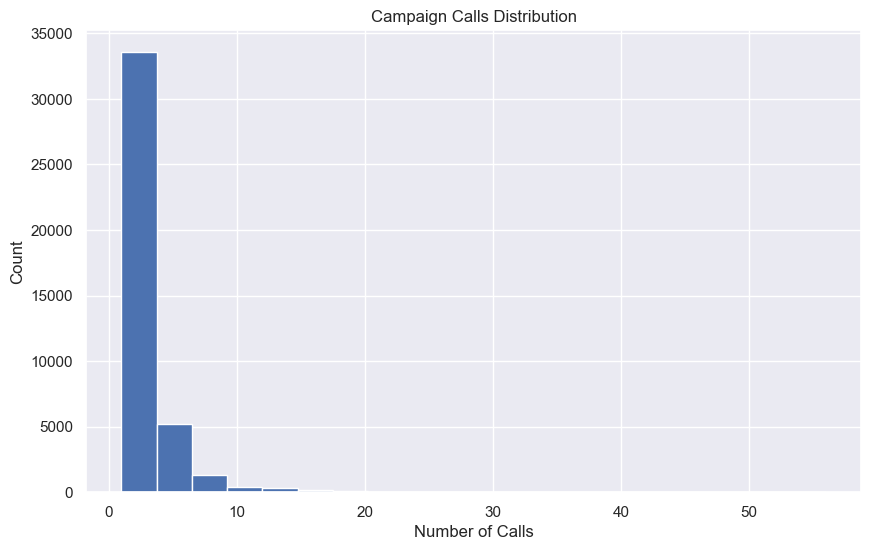

In [5]:
# Histogram of campaign calls
fig, ax = plt.subplots(figsize=(10, 6))
ax.hist(df['campaign'], bins=20)
ax.set_title('Campaign Calls Distribution')
ax.set_xlabel('Number of Calls')
ax.set_ylabel('Count')
plt.show()

In [6]:
#examine target variable
df.y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 41188 entries, 0 to 41187
Series name: y
Non-Null Count  Dtype 
--------------  ----- 
41188 non-null  object
dtypes: object(1)
memory usage: 321.9+ KB


In [7]:
#check target variable responses
df.y.unique()

array(['no', 'yes'], dtype=object)

In [8]:
#set the target variable to binomial
df['target'] = df['y'].apply(lambda row: 1 if row == 'yes' else 0)
df[['y', 'target']].tail(10)

,y,target
41178,yes,1
41179,no,0
41180,no,0
41181,yes,1
41182,no,0
41183,yes,1
41184,no,0
41185,no,0
41186,yes,1
41187,no,0


In [9]:
#convert data to numeric
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

#encoding/transforming
df['job'] = le.fit_transform(df['job'].astype('str'))
df['marital'] = le.fit_transform(df['marital'].astype('str'))
df['education'] = le.fit_transform(df['education'].astype('str'))
df['default'] = le.fit_transform(df['default'].astype('str'))
df['housing'] = le.fit_transform(df['housing'].astype('str'))
df['loan'] = le.fit_transform(df['loan'].astype('str'))
df['contact'] = le.fit_transform(df['contact'].astype('str'))
df['month'] = le.fit_transform(df['month'].astype('str'))
df['day_of_week'] = le.fit_transform(df['day_of_week'].astype('str'))
df['poutcome'] = le.fit_transform(df['poutcome'].astype('str'))

In [10]:
#drop original y feature object
df.drop(['y'],axis=1,inplace=True)
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,56,3,1,0,0,0,0,1,6,1,...,1,999,0,1,1.100,93.994,-36.400,4.857,5191.000,0
1,57,7,1,3,1,0,0,1,6,1,...,1,999,0,1,1.100,93.994,-36.400,4.857,5191.000,0
2,37,7,1,3,0,2,0,1,6,1,...,1,999,0,1,1.100,93.994,-36.400,4.857,5191.000,0
3,40,0,1,1,0,0,0,1,6,1,...,1,999,0,1,1.100,93.994,-36.400,4.857,5191.000,0
4,56,7,1,3,0,0,2,1,6,1,...,1,999,0,1,1.100,93.994,-36.400,4.857,5191.000,0


In [11]:
#check shape
df.shape

(41188, 21)

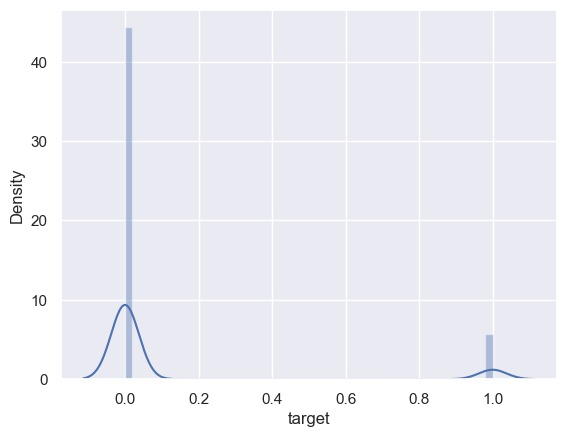

In [12]:
#view target distribution
_ = sns.distplot(df.target)

In [13]:
#check null values
print(df[df.isnull().any(axis=1)])

Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, pdays, previous, poutcome, emp.var.rate, cons.price.idx, cons.conf.idx, euribor3m, nr.employed, target]
Index: []

[0 rows x 21 columns]


In [14]:
#normalize the data
df = df.apply(lambda x: (x - x.min()) / (x.max() - x.min())) # Min-Max Normalization

In [15]:
#check values after normalization
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,target
0,0.481,0.273,0.333,0.000,0.000,0.000,0.000,1.000,0.667,0.250,...,0.000,1.000,0.000,0.500,0.938,0.699,0.603,0.957,0.860,0.000
1,0.494,0.636,0.333,0.429,0.500,0.000,0.000,1.000,0.667,0.250,...,0.000,1.000,0.000,0.500,0.938,0.699,0.603,0.957,0.860,0.000
2,0.247,0.636,0.333,0.429,0.000,1.000,0.000,1.000,0.667,0.250,...,0.000,1.000,0.000,0.500,0.938,0.699,0.603,0.957,0.860,0.000
3,0.284,0.000,0.333,0.143,0.000,0.000,0.000,1.000,0.667,0.250,...,0.000,1.000,0.000,0.500,0.938,0.699,0.603,0.957,0.860,0.000
4,0.481,0.636,0.333,0.429,0.000,0.000,1.000,1.000,0.667,0.250,...,0.000,1.000,0.000,0.500,0.938,0.699,0.603,0.957,0.860,0.000


<Axes: >

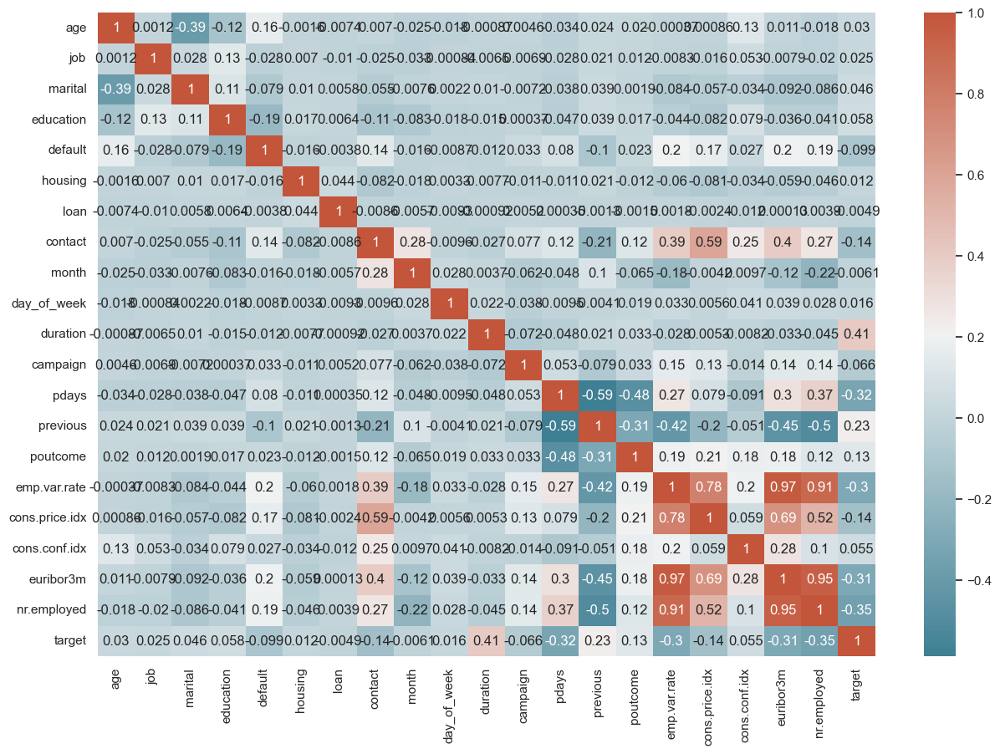

In [16]:
#examine linear correlation
corr = df.corr()
plt.subplots(figsize=(15,10))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))

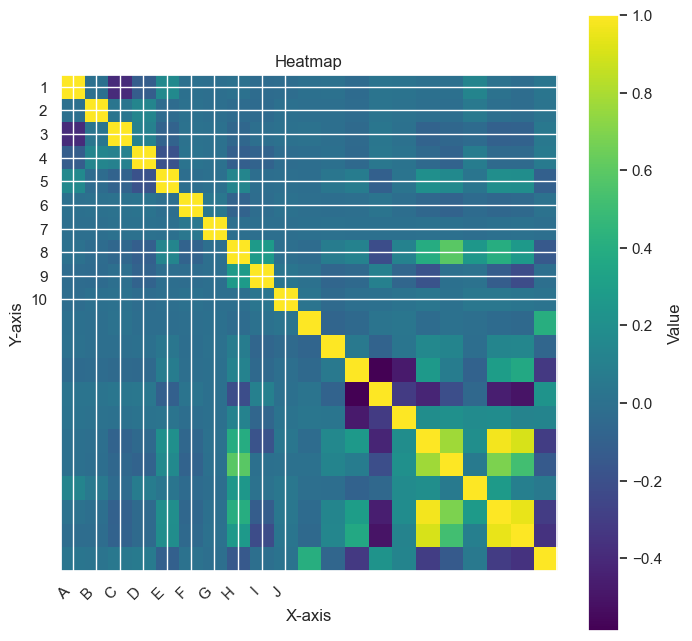

In [17]:
# Examine linear correlation
corr = df.corr()

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the heatmap
heatmap = ax.imshow(corr, cmap='viridis')

# Add a colorbar
cbar = plt.colorbar(heatmap)

# Set the title and labels
ax.set_title('Heatmap')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

# Customize the colorbar
cbar.set_label('Value')

# Customize the ticks
ax.set_xticks(np.arange(10))
ax.set_yticks(np.arange(10))

# Customize the tick labels
ax.set_xticklabels(['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J'])
ax.set_yticklabels(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])

# Rotate the tick labels for better readability
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# Show the plot
plt.show()

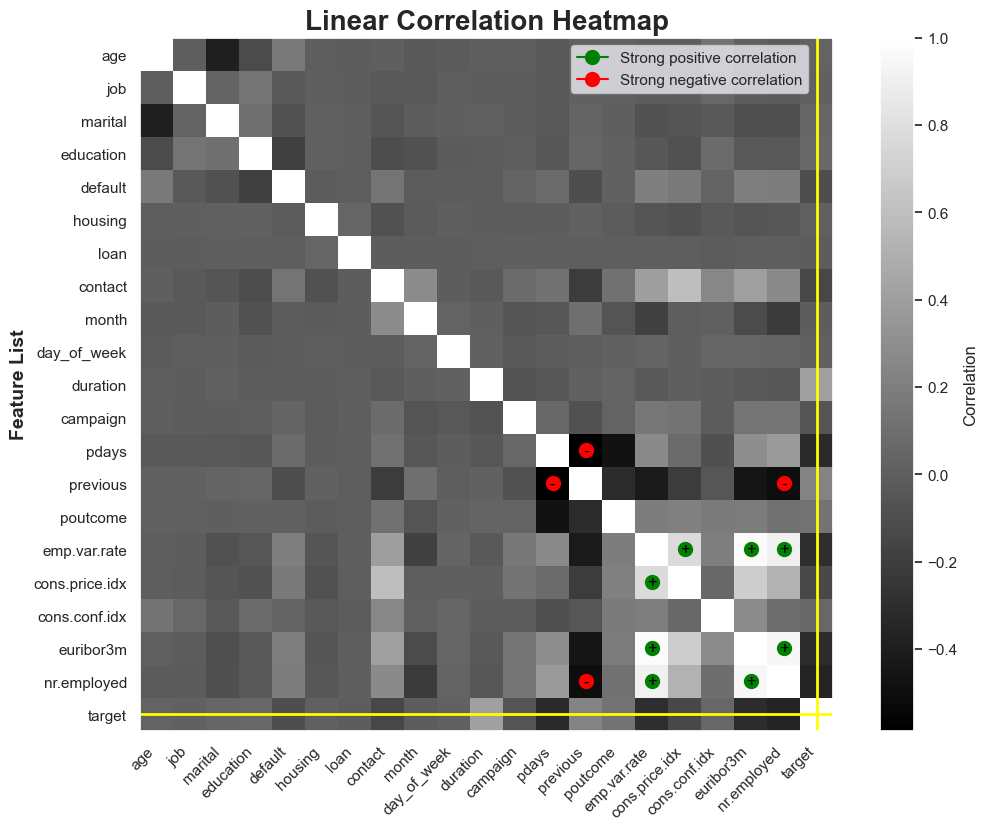

In [18]:
# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(12, 9))

# Create the heatmap using imshow()
heatmap = ax.imshow(corr, cmap='gray')

# Highlight the "target" row and column
target_index = corr.columns.tolist().index('target')
ax.axhline(target_index, color='yellow', linewidth=2)
ax.axvline(target_index, color='yellow', linewidth=2)

# Remove the grid lines
ax.grid(False)

# Add the colorbar
cbar = plt.colorbar(heatmap)

# Set the x and y tick labels
# Set the x and y tick labels
ax.set_xticks(np.arange(len(corr.columns)))
ax.set_yticks(np.arange(len(corr.columns)))
ax.set_xticklabels(corr.columns, rotation=45, ha='right')
ax.set_yticklabels(corr.columns)

# Set the title with larger font size and bold
title = ax.set_title('Linear Correlation Heatmap', fontsize=20, fontweight='bold')

# Adjust the position of the title
title.set_y(1.5)

# Add a vertical label to the y-axis
ax.set_ylabel('Feature List', rotation='vertical', fontsize=14, fontweight='bold')

# Customize the colorbar
cbar.set_label('Correlation')

# Add the spines
ax.spines['top'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
ax.spines['right'].set_visible(True)

# Annotate values between 0.75 and 0.99
for i in range(len(corr.columns)):
    for j in range(len(corr.columns)):
        value = corr.iloc[i, j]
        if 0.75 <= value <= 0.99:
            ax.plot(j, i, marker='o', markersize=10, color='green')
            ax.text(j, i, '+', fontsize=12, color='black', ha='center', va='center')

# Annotate values between -0.5 and -0.99
for i in range(len(corr.columns)):
    for j in range(len(corr.columns)):
        value = corr.iloc[i, j]
        if -0.5 >= value >= -0.99:
            ax.plot(j, i, marker='o', markersize=10, color='red')
            ax.text(j, i, '-', fontsize=12, color='black', ha='center', va='center')

# Create a legend
legend_elements = [
    plt.Line2D([0], [0], marker='o', markersize=10, color='green', label='Strong positive correlation'),
    plt.Line2D([0], [0], marker='o', markersize=10, color='red', label='Strong negative correlation')
]
ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(.975, 1))
            
# Show the plot
plt.show()

In [19]:
#trim the data set for features with low correlation to target
df = df.drop(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'month', 'day_of_week','campaign'], axis=1)

# Train-Test Split

In [20]:
#check features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   contact         41188 non-null  float64
 1   duration        41188 non-null  float64
 2   pdays           41188 non-null  float64
 3   previous        41188 non-null  float64
 4   poutcome        41188 non-null  float64
 5   emp.var.rate    41188 non-null  float64
 6   cons.price.idx  41188 non-null  float64
 7   cons.conf.idx   41188 non-null  float64
 8   euribor3m       41188 non-null  float64
 9   nr.employed     41188 non-null  float64
 10  target          41188 non-null  float64
dtypes: float64(11)
memory usage: 3.5 MB


In [21]:
#set cols, targets and features
cols = df.columns
target = 'target'
features = [c for c in cols if c != target]

#build array for X and y
array = df.values

X = array[:, 0:9]
y = array[:, 10]

In [22]:
#view y array
y

array([0., 0., 0., ..., 0., 1., 0.])

In [23]:
#split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# KNeighborsClassifier

In [24]:
#run KNN model test
model_knn = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
model_knn.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=-1, n_neighbors=3)

In [25]:
# gather the predictations that our model made for our test set
preds_knn = model_knn.predict(X_test)

# display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(preds_knn)

Actuals for test data set
[0. 0. 0. ... 0. 1. 0.]
Predictions for test data set
[0. 0. 0. ... 0. 0. 0.]


In [26]:
#check r2 metric
print(r2_score(y_test,preds_knn))


-0.03272012600491614


In [27]:
#look for optimal k value
scores_knn = []
print(f'Features: {features} \nTarget: {target}')

# remember the ending number for range is not inclusive
for k in range(2, 20):

    print(f'Evaluating {k} clusters')
    
    model_knn = KNeighborsClassifier(n_neighbors=k, n_jobs=-1)
    model_knn.fit(X_train, y_train)
    scores_knn.append(model_knn.score(X_test, y_test))

Features: ['contact', 'duration', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed'] 
Target: target
Evaluating 2 clusters
Evaluating 3 clusters
Evaluating 4 clusters
Evaluating 5 clusters
Evaluating 6 clusters
Evaluating 7 clusters
Evaluating 8 clusters
Evaluating 9 clusters
Evaluating 10 clusters
Evaluating 11 clusters
Evaluating 12 clusters
Evaluating 13 clusters
Evaluating 14 clusters
Evaluating 15 clusters
Evaluating 16 clusters
Evaluating 17 clusters
Evaluating 18 clusters
Evaluating 19 clusters


[0.898761835396941,
 0.896091284292304,
 0.900825443068706,
 0.9031318281136198,
 0.9062879339645545,
 0.9078659868900218,
 0.906409322651129,
 0.9075018208302986,
 0.9068948773974266,
 0.9085943190094683,
 0.9071376547705754,
 0.9092012624423403,
 0.9092012624423403,
 0.9099295945617868,
 0.9085943190094683,
 0.9088370963826171,
 0.9087157076960427,
 0.9088370963826171]

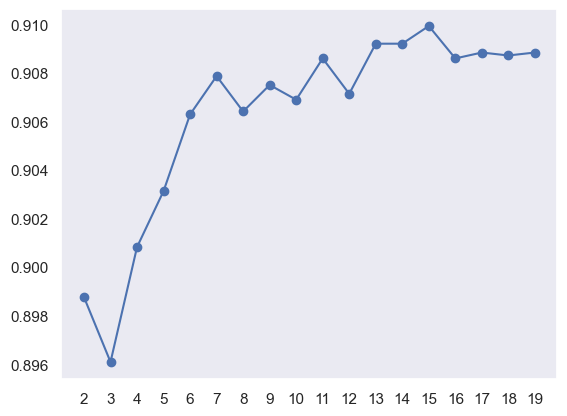

In [28]:
#view scores
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(range(2, 20), scores_knn)
plt.scatter(range(2, 20), scores_knn)
plt.grid()
_=plt.xticks(range(2,20))
scores_knn

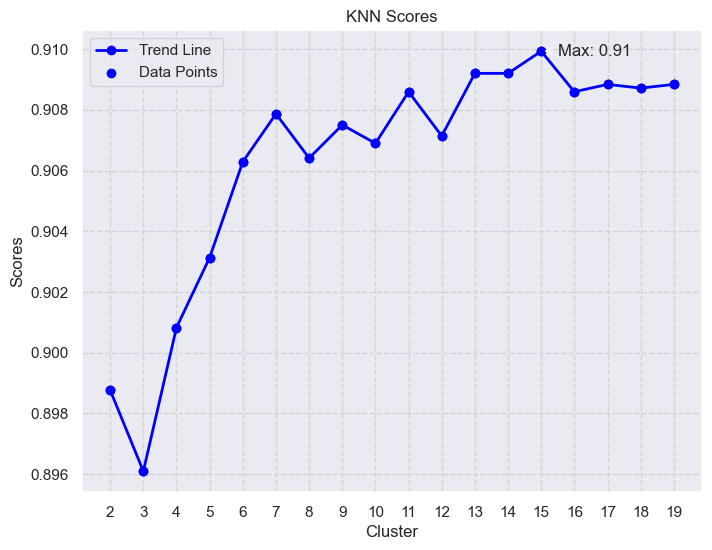

In [29]:
# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the line graph
ax.plot(range(2, 20), scores_knn, marker='o', linestyle='-', color='blue', linewidth=2, label='Trend Line')

# Plot the scatter plot
ax.scatter(range(2, 20), scores_knn, color='blue', label='Data Points')

# Set the title, x-label, and y-label
ax.set_title('KNN Scores')
ax.set_xlabel('Cluster')
ax.set_ylabel('Scores')

# Customize the grid
ax.grid(color='lightgray', linestyle='--')

# Set the x-ticks
ax.set_xticks(range(2, 20))

# Add a legend
ax.legend()

# Find the maximum y value and its corresponding x value
max_score = max(scores_knn)
max_index = scores_knn.index(max_score)
max_x = range(2, 20)[max_index]

# Add a label at the maximum y value
ax.annotate(f'Max: {max_score:.2f}', xy=(max_x, max_score), xytext=(max_x + 0.5, max_score),
             arrowprops=dict(facecolor='black', arrowstyle='->'), ha='left', va='center')

# Show the plot
plt.show()

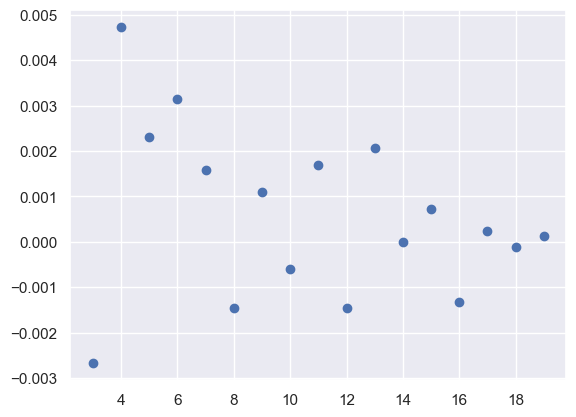

In [30]:
# compare the scree plot with a np.diff() plot

plt.scatter(range(3, 20), np.diff(scores_knn))

It looks like k = 8 is the best choice to run the model

In [31]:
#verify shape
print("Shape of the array = ",np.shape(X));

Shape of the array =  (41188, 9)


In [32]:
# define and fit our model
model_knn = KNeighborsRegressor(n_neighbors=8, n_jobs=-1)
model_knn.fit(X_train, y_train)

# gather the predictations that our model made for our test set
preds_knn = model_knn.predict(X_test)

# display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(preds_knn)

Actuals for test data set
[0. 0. 0. ... 0. 1. 0.]
Predictions for test data set
[0.125 0.    0.    ... 0.    0.375 0.   ]


In [33]:
#check differences
differs_knn = y_test - preds_knn

print(f'Differences between the two sets:\n{differs_knn}\n')

print(f'r2_score: {r2_score(y_test,preds_knn)}')

Differences between the two sets:
[-0.125  0.     0.    ...  0.     0.625  0.   ]

r2_score: 0.3615812553408204


In [34]:
from sklearn import neighbors, datasets, preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

scaler = preprocessing.StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

knn = neighbors.KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

0.8957271182325808
              precision    recall  f1-score   support

         0.0       0.93      0.95      0.94      7303
         1.0       0.55      0.46      0.50       935

    accuracy                           0.90      8238
   macro avg       0.74      0.71      0.72      8238
weighted avg       0.89      0.90      0.89      8238

[[6947  356]
 [ 503  432]]


AUC score: <function auc at 0x000001E1727B2A70>


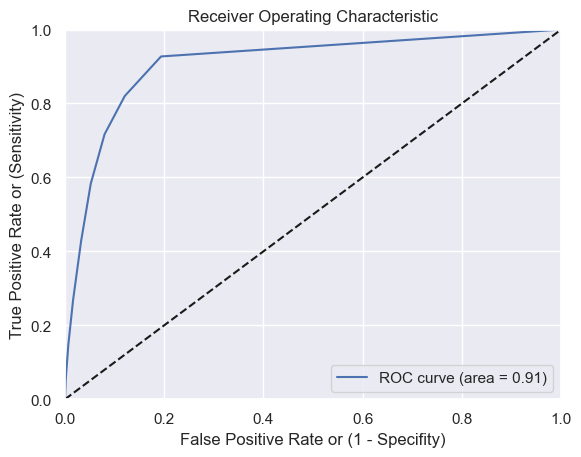

In [35]:
#import necessary libraries 
import pandas as pd 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_curve 

#create a ROC curve 
fpr, tpr, thresholds = roc_curve(y_test, preds_knn)

#Compute Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

#Plot the ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate or (1 - Specifity)')
plt.ylabel('True Positive Rate or (Sensitivity)')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.legend()

# Display the AUC score
print('AUC score:', auc)

The AUC metric is 0.91 which shows that this model is a good working model for this data set.

# Tree Classifiers  
The next two models, Decision Tree Classifier and Random Forest Classifier will both use the trimmed and normalized dataset from above. df = df_t the _t is for tree. I am changing the name to make sure that the variables don't become overused and display incorrect information. The task is to use the same data train/test split for all models, which is completed in the LazyClassifier below. I wanted to include all the steps for this classifier as a model for later work.

In [36]:
#new df
df_t = df.copy()

In [37]:
#view columns
for col in df_t.columns:
    print(col)

contact
duration
pdays
previous
poutcome
emp.var.rate
cons.price.idx
cons.conf.idx
euribor3m
nr.employed
target


<Axes: >

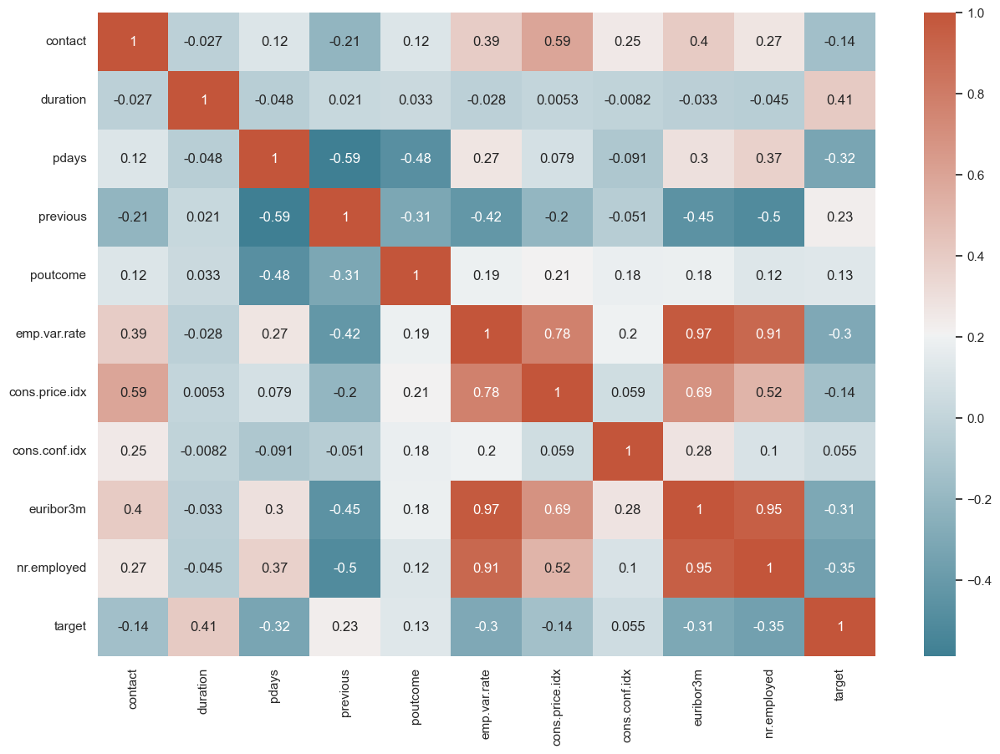

In [38]:
#visualize correlation
corr = df_t.corr()
plt.subplots(figsize=(15,10))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))

# Decision Tree Classifier

In [39]:
#check target variable value counts
df_t['target'].value_counts()

0.000    36548
1.000     4640
Name: target, dtype: int64

In [40]:
#gather up names of all the columns
cols = df_t.columns

#set the prediction column and the feature columns 
prediction_col = 'target'
feature_cols = [c for c in cols if c != prediction_col]

X = df_t[feature_cols].values
y = df_t[prediction_col].values

In [41]:
#splitting the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

In [42]:
#establish and fit the model using DecisonTree()
from sklearn import tree

tree_model = tree.DecisionTreeClassifier()
tree_model.fit(X_train, y_train)

#gathering the predictions
tree_preds = tree_model.predict(X_test)

In [43]:
#display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(tree_preds)

Actuals for test data set
[0. 0. 0. ... 0. 1. 0.]
Predictions for test data set
[0. 0. 0. ... 0. 1. 0.]


In [44]:
#using the sklearn.metrics package to determine the accuracy of the model
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test, tree_preds))
print(classification_report(y_test, tree_preds))
print(confusion_matrix(y_test, tree_preds))

0.8885651857246905
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94      7303
         1.0       0.51      0.49      0.50       935

    accuracy                           0.89      8238
   macro avg       0.72      0.71      0.72      8238
weighted avg       0.89      0.89      0.89      8238

[[6862  441]
 [ 477  458]]


0.000    7303
1.000     935
dtype: int64


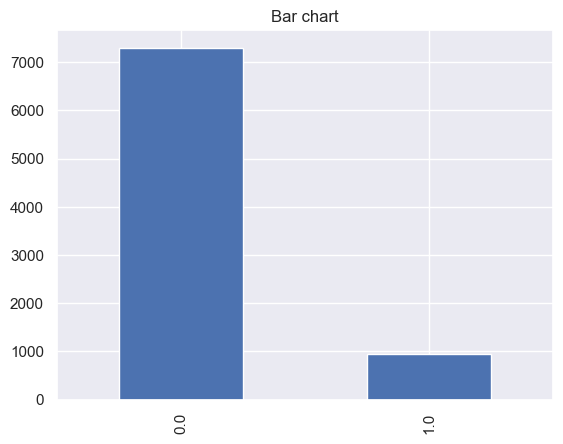

In [45]:
#visualize model performance for the test outcomes
test_by_quality=pd.value_counts(y_test, sort= True)
test_by_quality.plot(kind= 'bar')
plt.title('Bar chart')

print(test_by_quality)

0.000    7339
1.000     899
dtype: int64


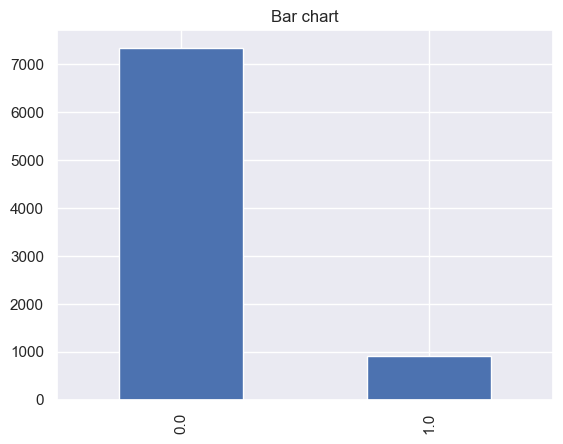

In [46]:
#visualize the predicted values
preds_by_quality=pd.value_counts(tree_preds, sort= True)
preds_by_quality.plot(kind= 'bar')
plt.title('Bar chart')

print(preds_by_quality)

In [47]:
#verify shape
X.shape

(41188, 10)

In [48]:
#verify shape
y.shape

(41188,)

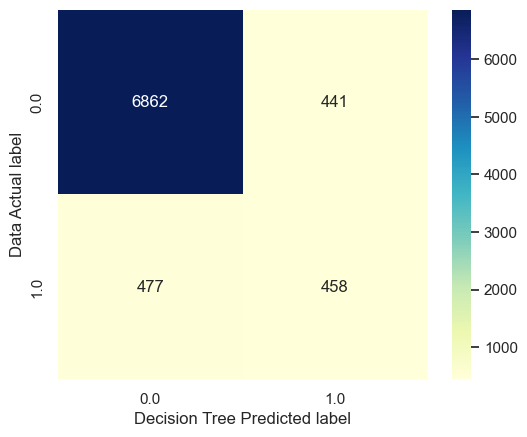

In [49]:
#make a confusion matrix to display the results
cm = confusion_matrix(y_test, tree_preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('Decision Tree Predicted label')
plt.ylabel('Data Actual label');

In [50]:
#Accuracy
print(accuracy_score(y_test, tree_preds))
# Precision
print(precision_score(y_test, tree_preds))
# Recall
print(recall_score(y_test, tree_preds))
# F1 Score
print(f1_score(y_test, tree_preds))

print(classification_report(y_test, tree_preds))
print(confusion_matrix(y_test, tree_preds))

0.8885651857246905
0.5094549499443827
0.4898395721925134
0.4994547437295529
              precision    recall  f1-score   support

         0.0       0.94      0.94      0.94      7303
         1.0       0.51      0.49      0.50       935

    accuracy                           0.89      8238
   macro avg       0.72      0.71      0.72      8238
weighted avg       0.89      0.89      0.89      8238

[[6862  441]
 [ 477  458]]


In [51]:
#display the importance features with our tree

importance_list = list(zip(feature_cols,tree_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature

[('duration', 0.5402568669992072),
 ('euribor3m', 0.16754620691043856),
 ('nr.employed', 0.16367001262150405),
 ('cons.conf.idx', 0.029866303412324283),
 ('pdays', 0.02848172629011862),
 ('cons.price.idx', 0.020358114486216123),
 ('previous', 0.01863699310545967),
 ('contact', 0.014926439274332726),
 ('poutcome', 0.011284463541970912),
 ('emp.var.rate', 0.004972873358427795)]

In [52]:
#convert to percentages for readability
max_feature_len = len(max(feature_cols, key=len))

In [53]:
#view contribution percentage
for feature, rank in sorted_import_feature:
    dots = max_feature_len - len(feature)
    print(f'{feature}: {"."*dots} {rank*100:.2f}%')

duration: ...... 54.03%
euribor3m: ..... 16.75%
nr.employed: ... 16.37%
cons.conf.idx: . 2.99%
pdays: ......... 2.85%
cons.price.idx:  2.04%
previous: ...... 1.86%
contact: ....... 1.49%
poutcome: ...... 1.13%
emp.var.rate: .. 0.50%


In [54]:
#import permutation_importance
from sklearn.inspection import permutation_importance

result = permutation_importance(tree_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)

forest_importances = pd.Series(result.importances_mean, index=feature_cols)

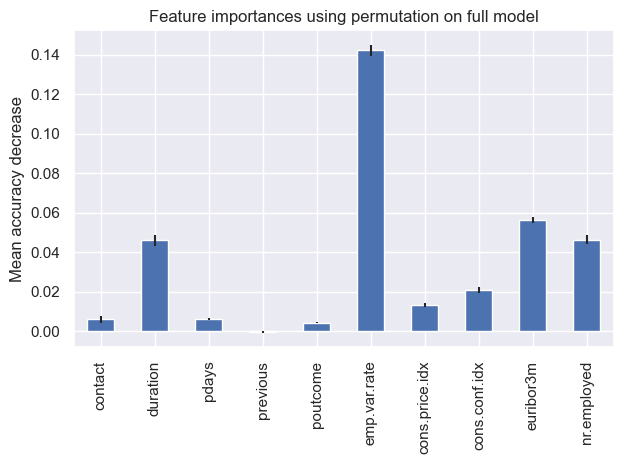

In [55]:
#visualize using permutation importance
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [56]:
!pip install pydotplus

In [57]:
import os
os.environ["PATH"] += os.pathsep + 'D:\\Anaconda3\\Library\\bin\\graphviz'

In [58]:
#verify installation
!pip install graphviz

In [59]:
import warnings

def function_that_warns():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    function_that_warns()  
    
#visualize data in a decision tree

import pydotplus
#from sklearn import tree (already imported)
import collections

dot_data = tree.export_graphviz(tree_model,
                                feature_names=feature_cols,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)

colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('decisiontree.png')


(process:17896): GLib-GIO-WARNING **: 21:12:56.524: Unexpectedly, UWP app `Microsoft.ScreenSketch_11.2304.21.0_x64__8wekyb3d8bbwe' (AUMId `Microsoft.ScreenSketch_8wekyb3d8bbwe!App') supports 29 extensions but has no verbs
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.246185 to fit



True

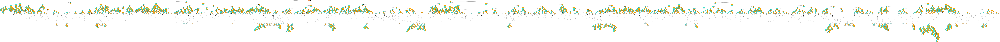

In [60]:
#display the png here
from IPython.display import Image

Image(filename='decisiontree.png') 

AUC score: <function auc at 0x000001E1727B2A70>


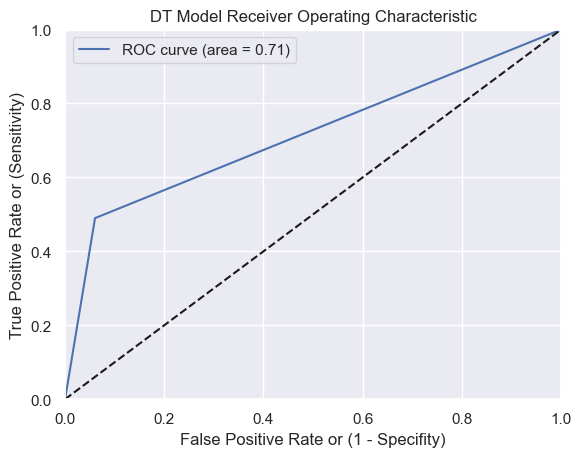

In [61]:
#create a ROC curve 
fpr, tpr, thresholds = roc_curve(y_test, tree_preds)

#Compute Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

#Plot the ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate or (1 - Specifity)')
plt.ylabel('True Positive Rate or (Sensitivity)')
plt.title('DT Model Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.legend()

# Display the AUC score
print('AUC score:', auc)

This model had a lower performance rating that the KNN model. The accuracy scores was 0.8885651857246905 and an AUC of 0.71.

# Random Forest Classification
For the same reasons listed above, in this model the dataframe was changed from df_t to df_r _r for random forest. 

In [62]:
#create random
import random
from random import randint
value = np.random.randint(100, size=41188)
print(value)

[82 33 99 ... 30 37 53]


In [63]:
#assign new df after random
df_r = df_t.assign(value = np.random.randint(100, size=41188))

In [64]:
#verify shape
df_r.shape

(41188, 12)

In [65]:
#gather column names
cols = df_r.columns
print(cols)

Index(['contact', 'duration', 'pdays', 'previous', 'poutcome', 'emp.var.rate',
       'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'target',
       'value'],
      dtype='object')


In [66]:
#set the prediction column and the feature columns for Random Forest
prediction_col = 'target'
feature_cols = [c for c in cols if c != prediction_col]

X = df_r[feature_cols].values
y = df_r[prediction_col].values

#split the dataset into the train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [67]:
#import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

forest_model = RandomForestClassifier(n_jobs = -1, random_state=42)
forest_model.fit(X_train,y_train)

#gathering the predictions
forest_preds = forest_model.predict(X_test)

In [68]:
#display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(forest_preds)

Actuals for test data set
[0. 0. 0. ... 0. 1. 0.]
Predictions for test data set
[0. 0. 0. ... 0. 1. 0.]


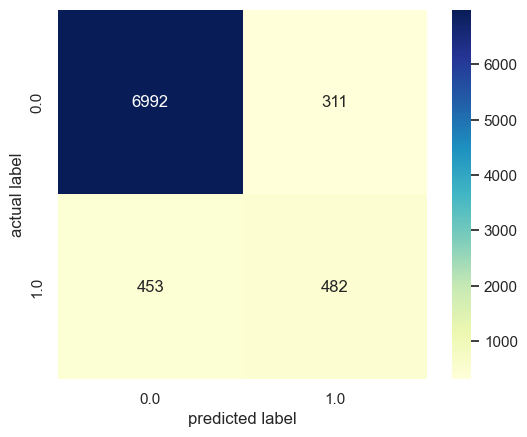

In [69]:
#make a confusion matrix to display the results
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, forest_preds)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');

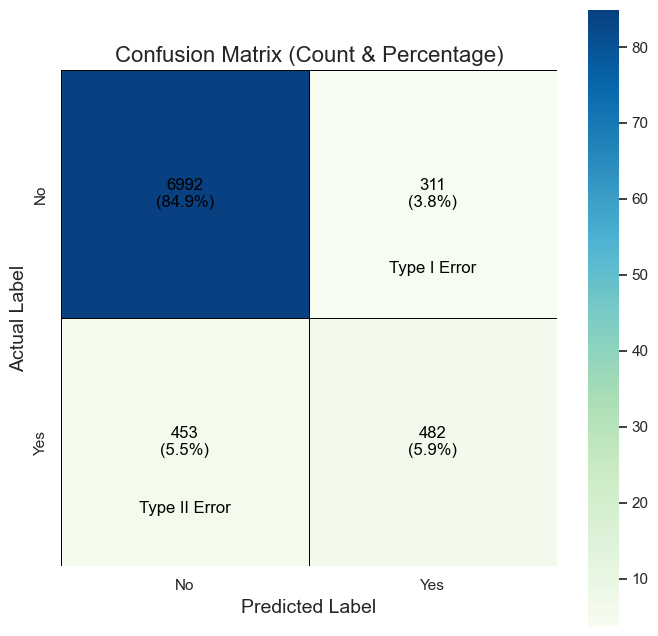

In [145]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, forest_preds)
target_labels = np.unique(y_test)

# Calculate the percentage values
cm_percent = cm / cm.sum() * 100

# Set the figure size
fig, ax = plt.subplots(figsize=(8, 8))

# Create the heatmap with seaborn using a blue gradient color map
cmap = "GnBu" # Choose a blue graduated color map
sns.heatmap(cm_percent, square=True, annot=False, fmt='.1f', cbar=True, cmap=cmap,
                      xticklabels=target_labels, yticklabels=target_labels, ax=ax,
                      linecolor='black', linewidths=0.5)

# Annotate the heatmap with count and percentage values
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        count = cm[i, j]
        percent = cm_percent[i, j]
        text = f"{count}\n({percent:.1f}%)"
        plt.text(j + 0.5, i + 0.5, text, ha='center', va='center', color='black', fontweight='normal')

# Set labels and title with adjusted font size
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('Actual Label', fontsize=14)
plt.title('Confusion Matrix (Count & Percentage)', fontsize=16, fontweight='normal')

# Annotate Type I Error in the upper right quadrant
plt.text(0.75, 0.60, "Type I Error", ha='center', va='center', color='black', fontsize=12, fontweight='normal',
         transform=ax.transAxes)

# Annotate Type II Error in the lower left quadrant
plt.text(0.25, 0.1, "Type II Error", ha='center', va='bottom', color='black', fontsize=12, fontweight='normal',
         transform=ax.transAxes)

# Update the tick labels
ax.set_xticklabels(['No', 'Yes'])  # Update horizontal labels
ax.set_yticklabels(['No', 'Yes'])  # Update vertical labels

# Show the plot
plt.show()

In [70]:
#Accuracy
print(accuracy_score(y_test, forest_preds))
# Precision
print(precision_score(y_test, forest_preds))
# Recall
print(recall_score(y_test, forest_preds))
# F1 Score
print(f1_score(y_test, forest_preds))

print(classification_report(y_test, forest_preds))
print(confusion_matrix(y_test, forest_preds))

0.9072590434571498
0.6078184110970997
0.5155080213903743
0.5578703703703705
              precision    recall  f1-score   support

         0.0       0.94      0.96      0.95      7303
         1.0       0.61      0.52      0.56       935

    accuracy                           0.91      8238
   macro avg       0.77      0.74      0.75      8238
weighted avg       0.90      0.91      0.90      8238

[[6992  311]
 [ 453  482]]


In [71]:
#display the importance features with our tree

importance_list = list(zip(feature_cols,forest_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature

[('duration', 0.4254727791063188),
 ('value', 0.1859291518874662),
 ('euribor3m', 0.163491713212789),
 ('nr.employed', 0.06944234693528586),
 ('pdays', 0.040175004212748194),
 ('cons.conf.idx', 0.02843566040948921),
 ('poutcome', 0.023935484566420688),
 ('cons.price.idx', 0.0224452379885451),
 ('emp.var.rate', 0.01581290831801932),
 ('previous', 0.013889546468778541),
 ('contact', 0.010970166894139158)]

In [72]:
#convert to percentages for readability
max_feature_len = len(max(feature_cols, key=len))

In [73]:
#view contribution percentage
for feature, rank in sorted_import_feature:
    dots = max_feature_len - len(feature)
    print(f'{feature}: {"."*dots} {rank*100:.2f}%')

duration: ...... 42.55%
value: ......... 18.59%
euribor3m: ..... 16.35%
nr.employed: ... 6.94%
pdays: ......... 4.02%
cons.conf.idx: . 2.84%
poutcome: ...... 2.39%
cons.price.idx:  2.24%
emp.var.rate: .. 1.58%
previous: ...... 1.39%
contact: ....... 1.10%


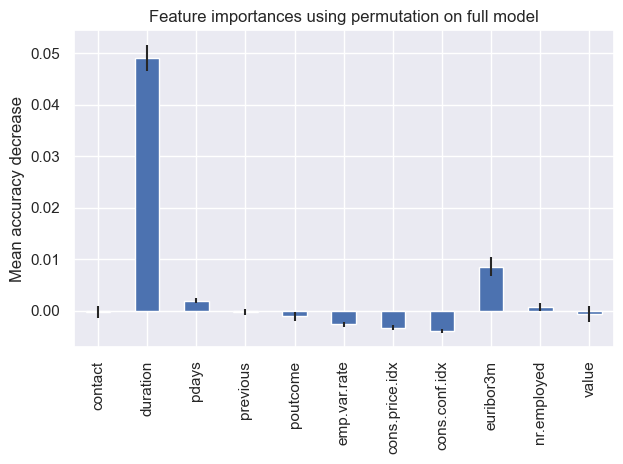

In [94]:
#visualize using permutation importance
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

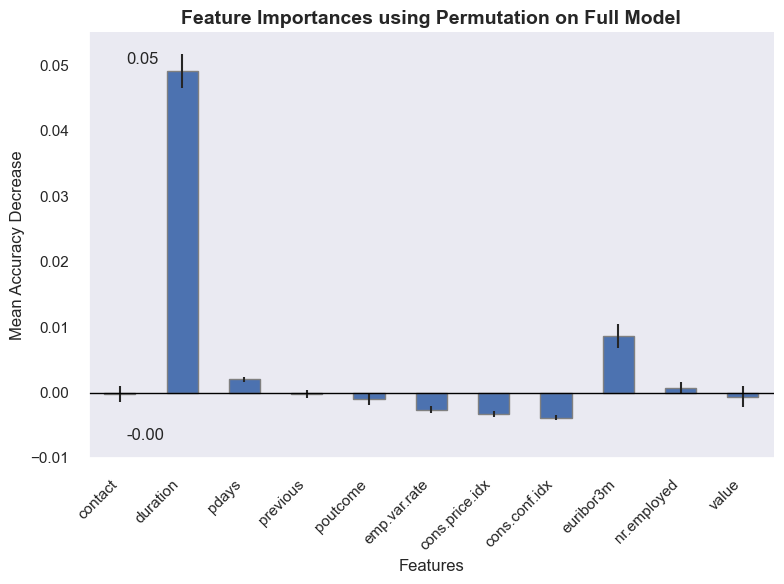

In [110]:
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the feature importances as a bar chart
forest_importances.plot.bar(yerr=result.importances_std, ax=ax, edgecolor='gray')

# Add a line at y=0
ax.axhline(0, color='black', linestyle='-', linewidth=1)

# Set the title and labels
ax.set_title("Feature Importances using Permutation on Full Model", fontsize=14, fontweight='bold')
ax.set_xlabel("Features", fontsize=12)
ax.set_ylabel("Mean Accuracy Decrease", fontsize=12)

# Remove the top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Remove the gridlines
ax.grid(False)

# Adjust the padding between ticks and labels
ax.tick_params(axis='x', pad=8)
ax.tick_params(axis='y', pad=8)

# Set the vertical axis limits from -0.01 to 0.05
ax.set_ylim(-0.01, 0.055)

# Annotate the maximum value
max_value = forest_importances.max()
ax.annotate(f'{max_value:.2f}', xy=(0, max_value), xytext=(5, 3),
             textcoords='offset points', ha='left', va='bottom')

# Angle the horizontal labels
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Annotate the minimum value
min_value = forest_importances.min()
ax.annotate(f'{min_value:.2f}', xy=(0, min_value), xytext=(5, -7),
             textcoords='offset points', ha='left', va='top')

# Set the layout tight and adjust spacing
fig.tight_layout()

# Show the plot
plt.show()

In [75]:
#import permutation_importance
from sklearn.inspection import permutation_importance


result = permutation_importance(
    forest_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1
)
forest_importances = pd.Series(result.importances_mean, index=feature_cols)

In [76]:
#verify installation
!pip install graphviz

In [77]:
#verify graphviz
from sklearn.tree import export_graphviz

estimator= forest_model.estimators_[50] #extract one tree to test
features = cols[:-1]

In [78]:
#build graph
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [79]:
#convert to png using system command
from subprocess import call
call (['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

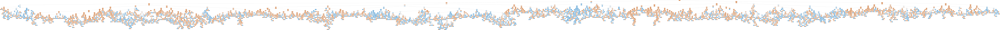

In [80]:
#display in notebook
from IPython.display import Image
Image(filename='tree.png')

AUC score: <function auc at 0x000001E1727B2A70>


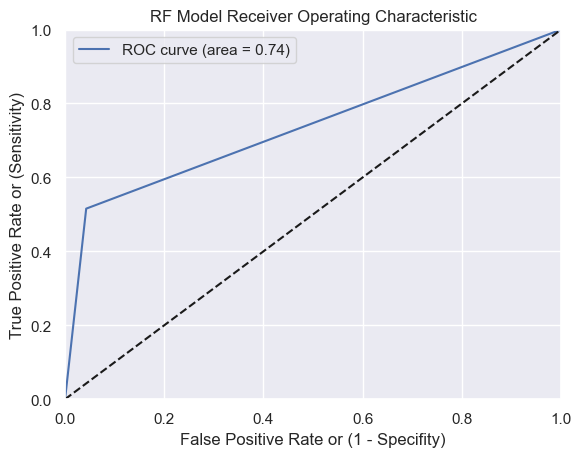

In [81]:
#create a ROC curve 
fpr, tpr, thresholds = roc_curve(y_test, forest_preds)

#Compute Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

#Plot the ROC Curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate or (1 - Specifity)')
plt.ylabel('True Positive Rate or (Sensitivity)')
plt.title('RF Model Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.legend()

# Display the AUC score
print('AUC score:', auc)

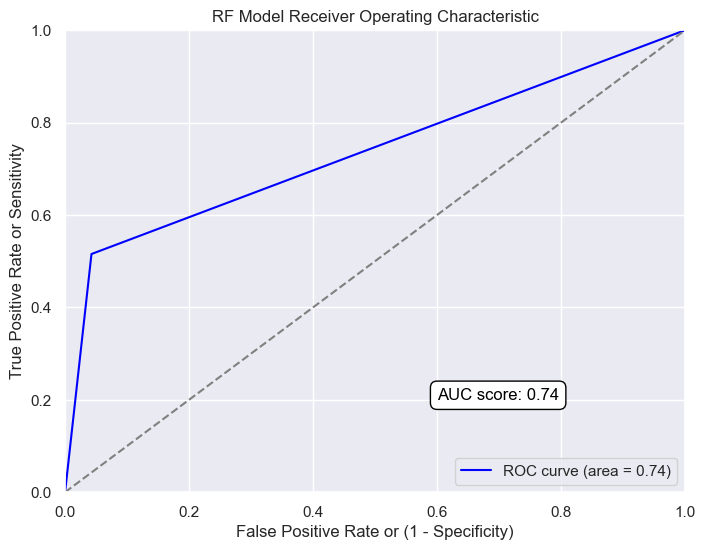

In [82]:
# Create a ROC curve
fpr, tpr, thresholds = roc_curve(y_test, forest_preds)

# Compute Area Under the Curve (AUC)
roc_auc = auc(fpr, tpr)

# Create the figure and axis objects
fig, ax = plt.subplots(figsize=(8, 6))

# Plot the ROC Curve
ax.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc, color='blue')
ax.plot([0, 1], [0, 1], 'k--', color='gray')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.0])
ax.set_xlabel('False Positive Rate or (1 - Specificity)')
ax.set_ylabel('True Positive Rate or Sensitivity')
ax.set_title('RF Model Receiver Operating Characteristic')
ax.legend(loc='lower right')

# Display the AUC score
ax.text(0.6, 0.2, 'AUC score: %0.2f' % roc_auc, fontsize=12, color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.4'))

# Show the plot
plt.show()

The accuracy score increased using RandomForestClassifier to 0.9067734887108522 which is the best performance of these three models.

# Compare Models

In [83]:
# Spot Check Algorithms
models = []

models.append(('LR', LinearRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('DT', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))


In [84]:
#set parameters
seed = 42
num_folds = 5
scoring = 'neg_mean_squared_error'

In [85]:
#use kfold to compare models
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: -0.066306 (0.001104)
KNN: -0.107162 (0.001949)
DT: -0.112564 (0.002667)
RF: -0.092747 (0.002836)


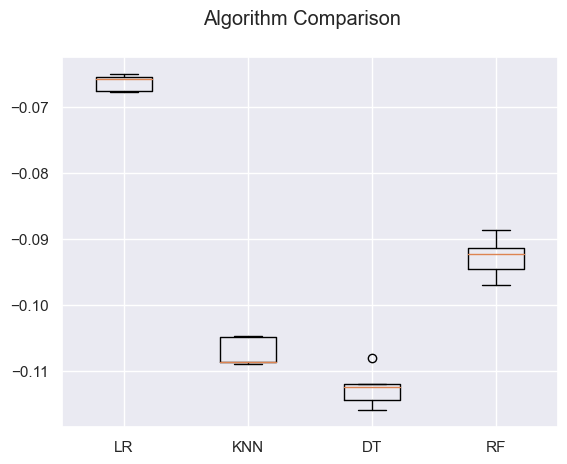

In [86]:
from matplotlib import pyplot
# Compare Algorithms
fig = pyplot.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
pyplot.boxplot(results)
ax.set_xticklabels(names)
pyplot.show()

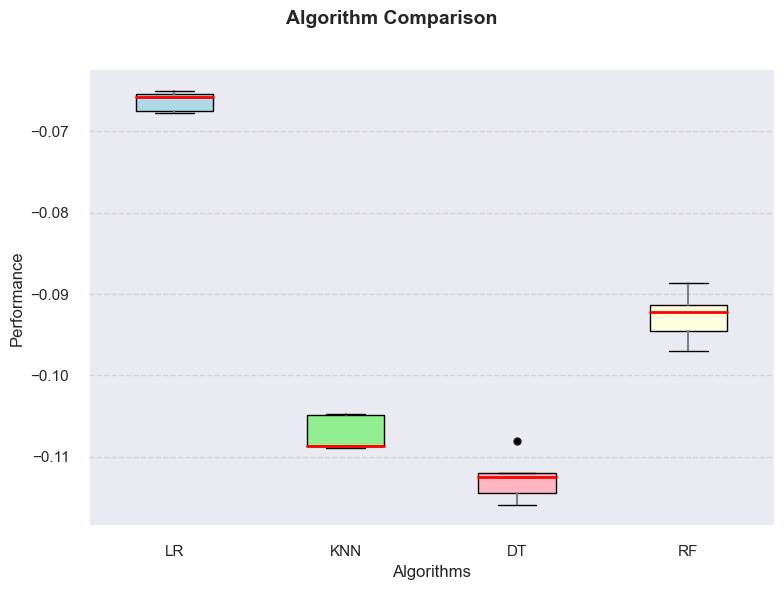

In [92]:
from matplotlib import pyplot as plt

# Compare Algorithms
fig, ax = plt.subplots(figsize=(8, 6))
fig.suptitle('Algorithm Comparison', fontsize=14, fontweight='bold')

# Customize the boxplot
boxplot = ax.boxplot(results, patch_artist=True, sym='k.')
colors = ['lightblue', 'lightgreen', 'lightpink', 'lightyellow']  # Customize the colors for the boxes

# Remove gridlines
ax.grid(False)

# Set the colors for the boxes
for patch, color in zip(boxplot['boxes'], colors):
    patch.set_facecolor(color)

# Set the whisker and cap colors
for whisker in boxplot['whiskers']:
    whisker.set(color='gray', linewidth=1.5)

# Set the median line color
for median in boxplot['medians']:
    median.set(color='red', linewidth=2)

# Set the outlier marker color
for flier in boxplot['fliers']:
    flier.set(marker='o', markerfacecolor='black', markersize=5)

# Customize the x-axis labels
ax.set_xticklabels(names)
ax.set_xlabel('Algorithms', fontsize=12)
ax.set_ylabel('Performance', fontsize=12)

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Add gridlines
ax.yaxis.grid(color='lightgray', linestyle='--')

# Adjust the padding between ticks and labels
ax.tick_params(axis='x', pad=8)
ax.tick_params(axis='y', pad=8)

# Set the layout tight and adjust spacing
fig.tight_layout()
fig.subplots_adjust(top=0.88)

# Show the plot
plt.show()

It appears that the Linear Regression model performs better than KNN, DT, and RF. The next step would be to check Linear Regression. 

In [87]:
#assign new df name
df_L = df_r.copy()

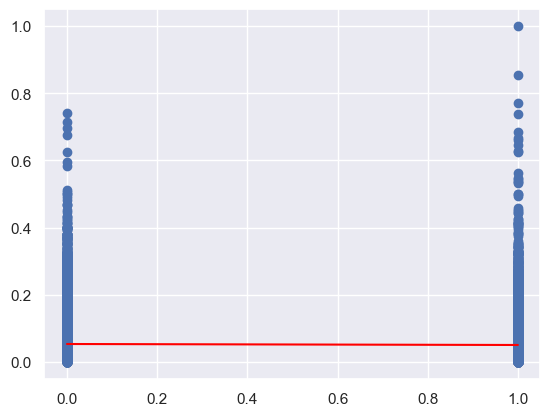

In [88]:
from sklearn.linear_model import LinearRegression

X = df_L.iloc[:, 0].values.reshape(-1, 1)  # values converts it into a numpy array
y = df_L.iloc[:, 1].values.reshape(-1, 1)  # -1 means that calculate the dimension of rows, but have 1 column

linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, y)  # perform linear regression

L_pred = linear_regressor.predict(X)  # make predictions

plt.scatter(X, y)
plt.plot(X, L_pred, color='red')
plt.show()

From the scatterplot we see that although the performance was compartively higher than KNN, DT, and RF - the model doesn't make sense which emphasized the point that model examination is extremely important rather than relying on the "best performer". My conculsion would be (of these models) to use RandomForestClassifier. 

# LazyClassifier
Compare all Classifier models on the same train/test split
https://buffml.com/run-all-machine-learning-models-in-once/

In [89]:
# Fit all models
clf = LazyClassifier(predictions=True)
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
models

100%|██████████| 29/29 [01:35<00:00,  3.28s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.919,0.763,0.763,0.916,0.129
NearestCentroid,0.743,0.742,0.742,0.786,0.119
XGBClassifier,0.912,0.741,0.741,0.908,0.332
RandomForestClassifier,0.908,0.738,0.738,0.905,2.131
QuadraticDiscriminantAnalysis,0.879,0.736,0.736,0.883,0.043
DecisionTreeClassifier,0.888,0.727,0.727,0.889,0.121
ExtraTreesClassifier,0.905,0.725,0.725,0.901,2.283
BernoulliNB,0.831,0.724,0.724,0.848,0.031
BaggingClassifier,0.904,0.721,0.721,0.900,0.462


SVC, LogisticRegression, XGB, and LGBM had higher accuracy than RandomForest  with LGBM scoring the highest overall.

# Extra: LGBMClassifier

The highest performer from LazyClassifier was LGBM (Light Gradient Boosting Machine Classifier) which is another model that uses decision trees. LGBM Classifier works by building an ensemble of decision trees. Each tree is built sequentially and focuses on improving the areas where the previous trees made errors. The algorithm uses gradient-based optimization techniques to determine the best split points for each tree. Additionally, LGBM Classifier utilizes a technique called "leaf-wise" growth, where the algorithm chooses the leaf with the largest gradient and grows the tree in that direction. 

0.9168487496965283
0.6636125654450262
0.5422459893048128
0.5968216597998822


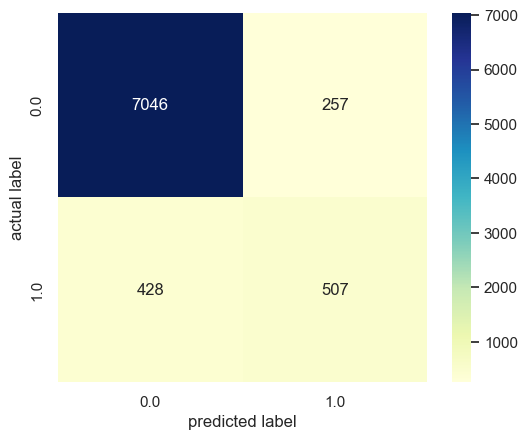

In [90]:
#LGBM Classifier Code:

from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

clf = LGBMClassifier()
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)

# Results
results_df = pd.DataFrame({"Actual": y_test, "Predicted": predictions})

# Confusion Matrix
pd.crosstab(y_test, predictions, rownames=['Actual'], colnames=['Predicted'])

# Accuracy
accuracy = accuracy_score(y_test, predictions)
print(accuracy)
# Precision
precision = precision_score(y_test, predictions)
print(precision)
# Recall
recall = recall_score(y_test, predictions)
print(recall)
# F1 Score
f1_score = f1_score(y_test, predictions)
print(f1_score)

cm = confusion_matrix(y_test, predictions)
target_labels = np.unique(y_test)

sns.heatmap(cm, square=True, annot=True, fmt='d', cbar=True, cmap="YlGnBu",
            xticklabels=target_labels, yticklabels=target_labels)

plt.xlabel('predicted label')
plt.ylabel('actual label');